In [1]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


## Parsing IMU Sensors for Gait Analysis


### REference GaitPY Docs

**Gait Classification**

In order to derive gait features from data collected under free-living conditions, it is essential to identify periods of walking activity. GaitPy includes :
- a pre-trained random forest (Breiman, 2001) binary classifier that operates on time and frequency domain features extracted from 3-second epochs of vertical acceleration data.

- Prior to feature extraction, raw vertical acceleration data is down-sampled to 50Hz and band-pass filtered using a 0.5-3Hz 1st order Butterworth filter.

- Extracted signal features include dominant frequency, the ratio of the
energy associated with the dominant frequency component to the total energy, the range of amplitude, the root mean square value of the signal, and the signal entropy.

- Gaitpy’s classify_bouts module applies this binary classifier to input data to classify each non-overlapping 3-second epoch as either gait or not-gait.




**Gait Features**

GaitPy implements a slightly modified version of a Gaussian continuous wavelet-based method (McCamley et al., 2012) and an inverted pendulum model (Zijlstra & Hof, 2003) to extract features from data collected during bouts of gait.

Three post-processing steps are applied to remove extraneous stride detections beyond physiological limits.

Step 1: Strides longer than 2.25 seconds or shorter than 0.25 seconds are
removed. (Najafi et al., 2003)

Step 2: Strides with stance times exceeding 70% of the maximal stride time of 2.25 seconds are removed. (Hollman, McDade, & Peterson, 2011)

Step 3: Strides with an initial double support that exceed 20% of the maximal stride time of 2.25
seconds are removed. (Hollman et al., 2011)



## Features to include

1. Dataset based extraction, eda, preprocessing and classifications
   1. Daphnet - 3 acceleration sensor data

   1. MobiFall - Acceleration force along the x y z axes, #Rate of rotation around the x y z axes (Angular velocity), #timestamp(ns), Azimuth , Pitch, Roll(degrees)

   1. https://mad-nas.cs.fau.de:8081/Research/ActivityNet/arduous_text_export2.zip


Step 1. Download dataset \\
Step 2. Extract dataset into a PD DAtaframe \\
Step 3. EDA Scripts - Scatterplots, Labellograms, Power Spectrums \\
Step 3. Perform preprocessing (Provide adapter, customizable) \\
Step 4. Perform feature extractions (Provide submodule for varying feature extractions) \\
Step 5. Keep classification labels consistent with the flow and make model loading scripts \\
Step 6. Make


1. Gait features:
   - stride length using imu decomposition
   - heel strike event mapping (using pressure sensors)

## EDA on DAPHNET DATASET

1. Data parsing
2. Labels
3. Windowing



In [2]:
!wget https://archive.ics.uci.edu/static/public/245/daphnet+freezing+of+gait.zip -o "/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/daphnet.zip"

In [3]:
import os
file_path = "/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset"
list_data = os.listdir(file_path)

In [4]:
list_data

['S01R02.txt',
 'S02R01.txt',
 'S01R01.txt',
 'S04R01.txt',
 'S03R03.txt',
 'S03R01.txt',
 'S03R02.txt',
 'S02R02.txt',
 'S05R01.txt',
 'S07R02.txt',
 'S06R02.txt',
 'S07R01.txt',
 'S06R01.txt',
 'S05R02.txt',
 'S08R01.txt',
 'S09R01.txt',
 'S10R01.txt']

In [5]:
daphnetThigh = []
daphnetNames = []
import pandas as pd
import numpy as np
from glob import glob

for i in sorted(glob("/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S*.txt")):
    daphnetNames.append(i.split("\\")[-1])
    csv = pd.read_csv(i, sep=" ", names=["time", "shank_h_fd", "shank_v", "shank_h_l", "thigh_h_fd", "thigh_v", "thigh_h_l", "trunk_h_fd", "trunk_v", "trunk_h_l", "annotations"])[["time", "thigh_h_fd", "thigh_v", "thigh_h_l", "annotations"]].set_index("time")
    csv["thigh"] = np.sqrt(csv["thigh_h_l"]**2 + csv["thigh_v"]**2 + csv["thigh_h_fd"]**2)
    csv = csv[["thigh_h_fd", "thigh_v", "thigh_h_l", "thigh", "annotations"]]
    #daphnet.append(pd.read_csv(i, sep=" ", names=["time", "shank_h_fd", "shank_v", "shank_h_l", "thigh_h_fd", "thigh_v", "thigh_h_l", "trunk_h_fd", "trunk_v", "trunk_h_l", "annotations"]))
    daphnetThigh.append(csv)

daphnetThigh[0]

,thigh_h_fd,thigh_v,thigh_h_l,thigh,annotations
time,,,,,
15,0,0,0,0.000000,0
31,0,0,0,0.000000,0
46,0,0,0,0.000000,0
62,0,0,0,0.000000,0
78,0,0,0,0.000000,0
...,...,...,...,...,...
2374734,9,-46,-1000,1001.097897,0
2374750,-9,-27,-979,979.413600,0
2374765,-18,-37,-979,979.864276,0


In [6]:
import matplotlib.pyplot as plt

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S01R01.txt


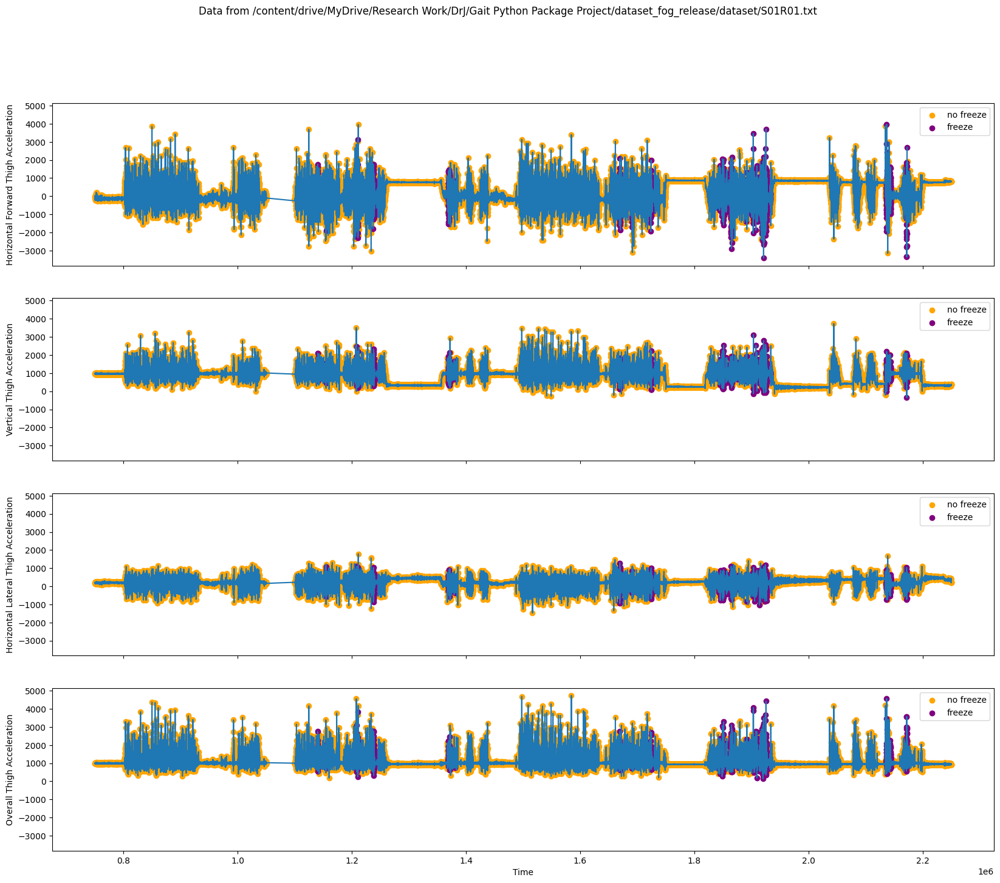

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S01R02.txt


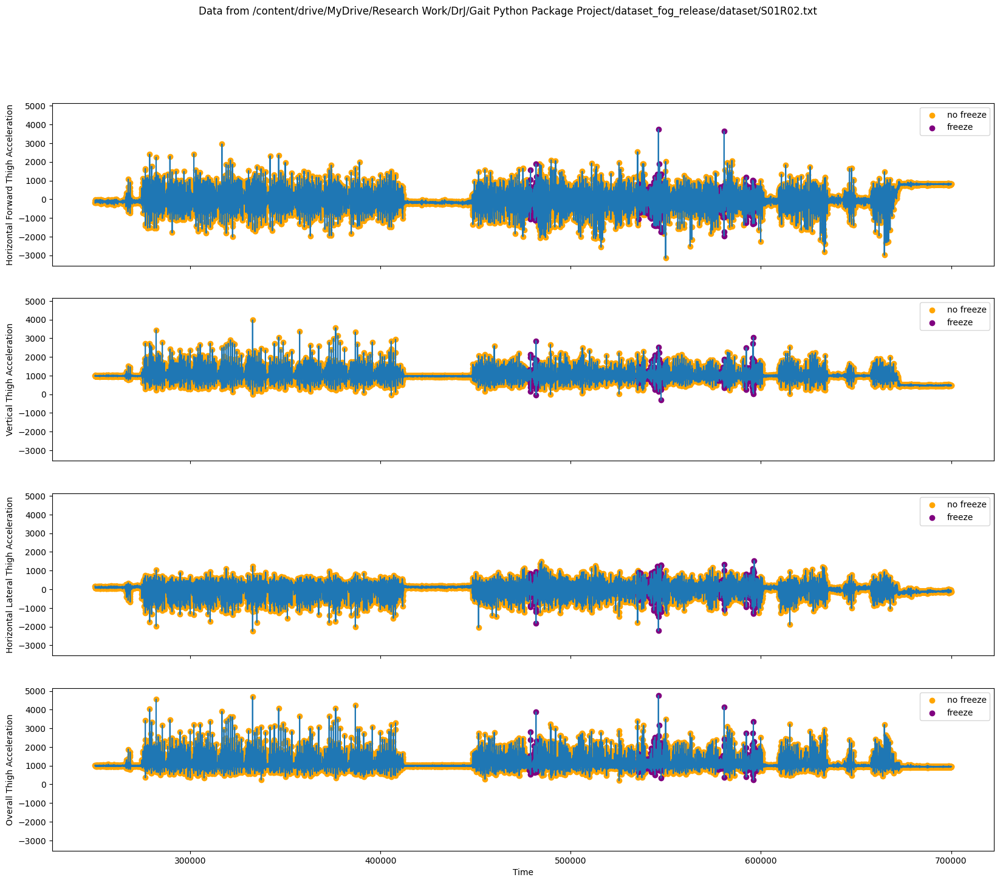

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S02R01.txt


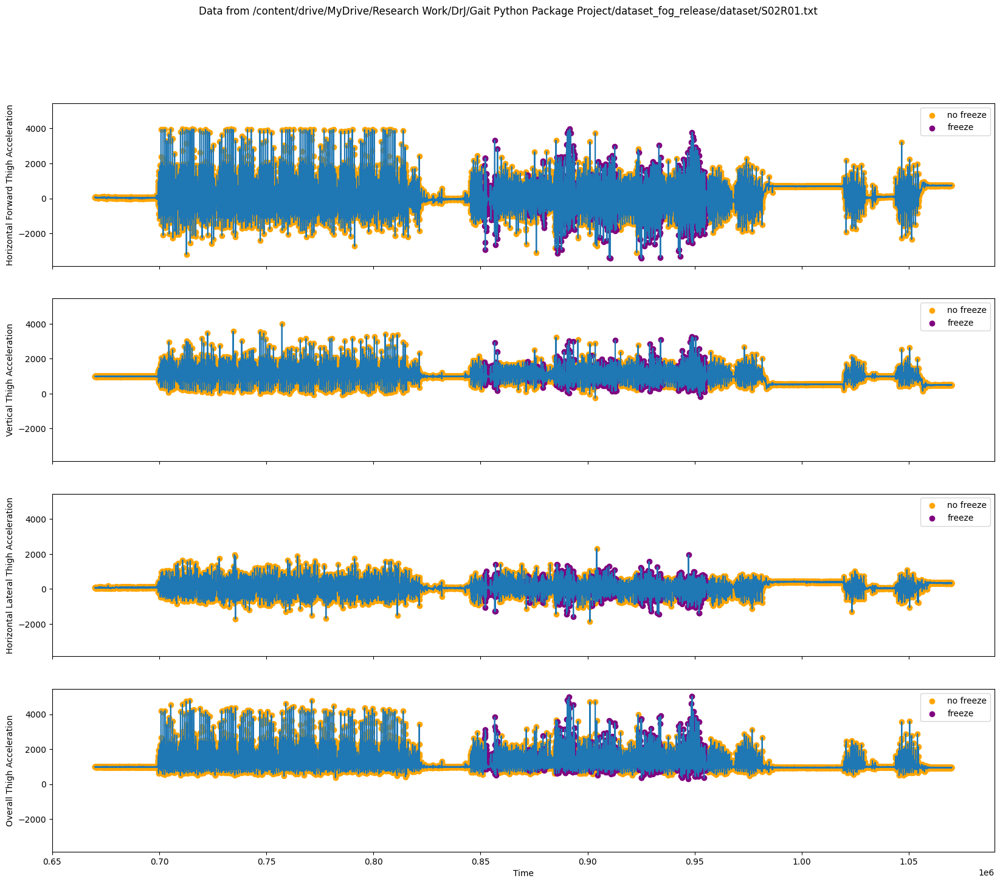

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S02R02.txt


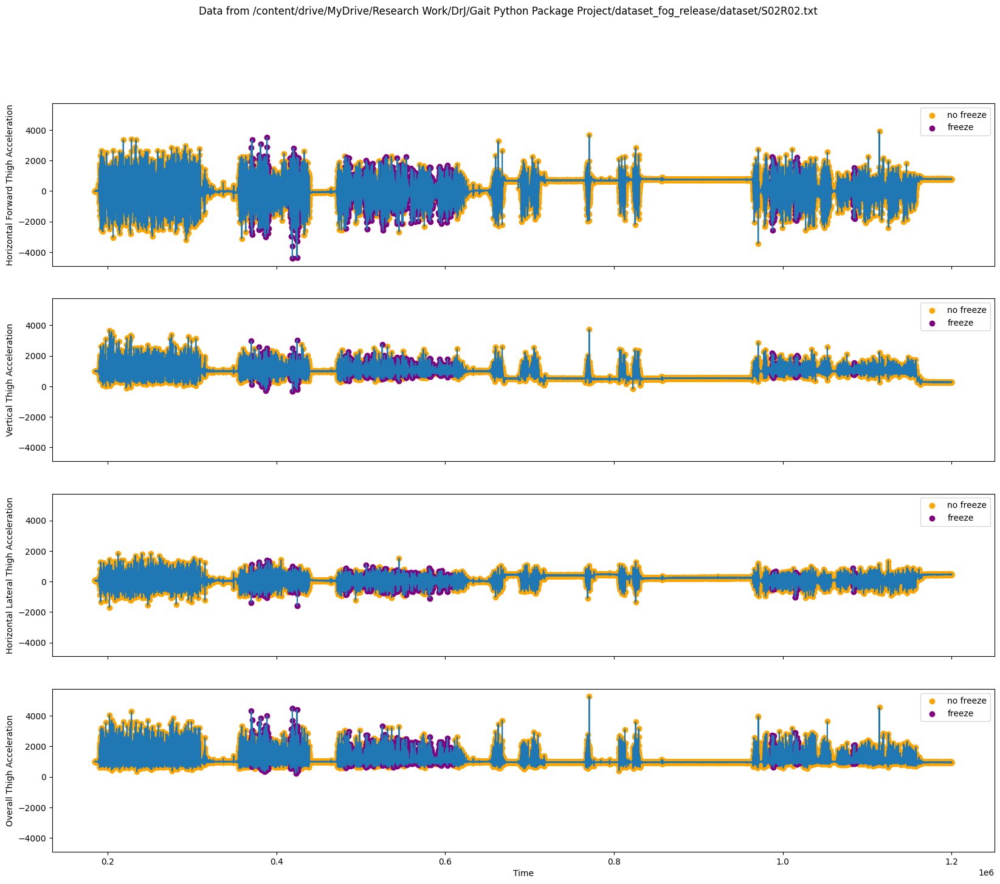

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S03R01.txt


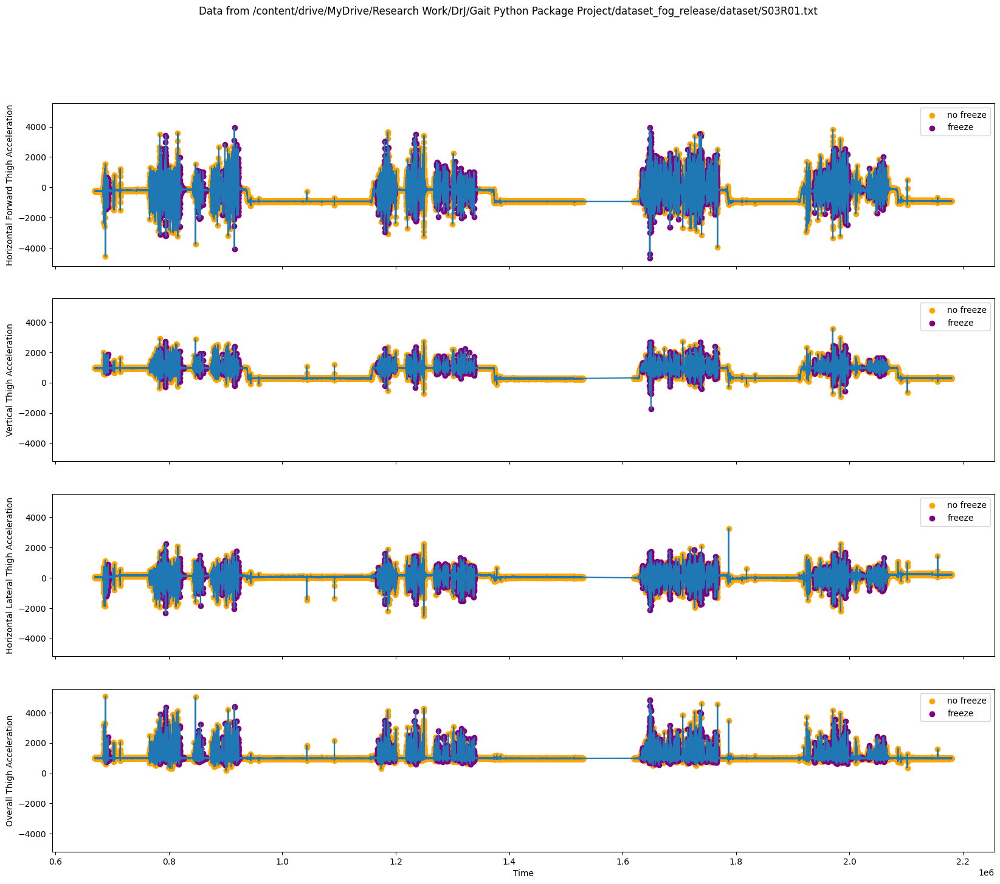

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S03R02.txt


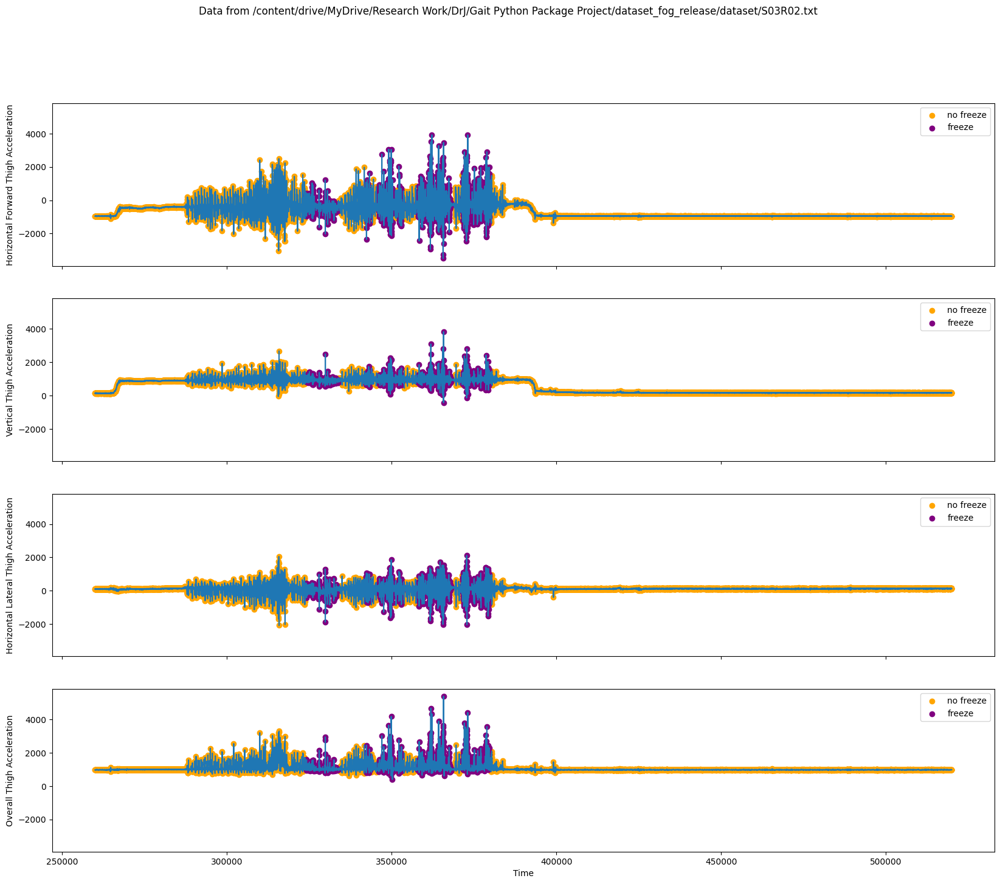

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S03R03.txt


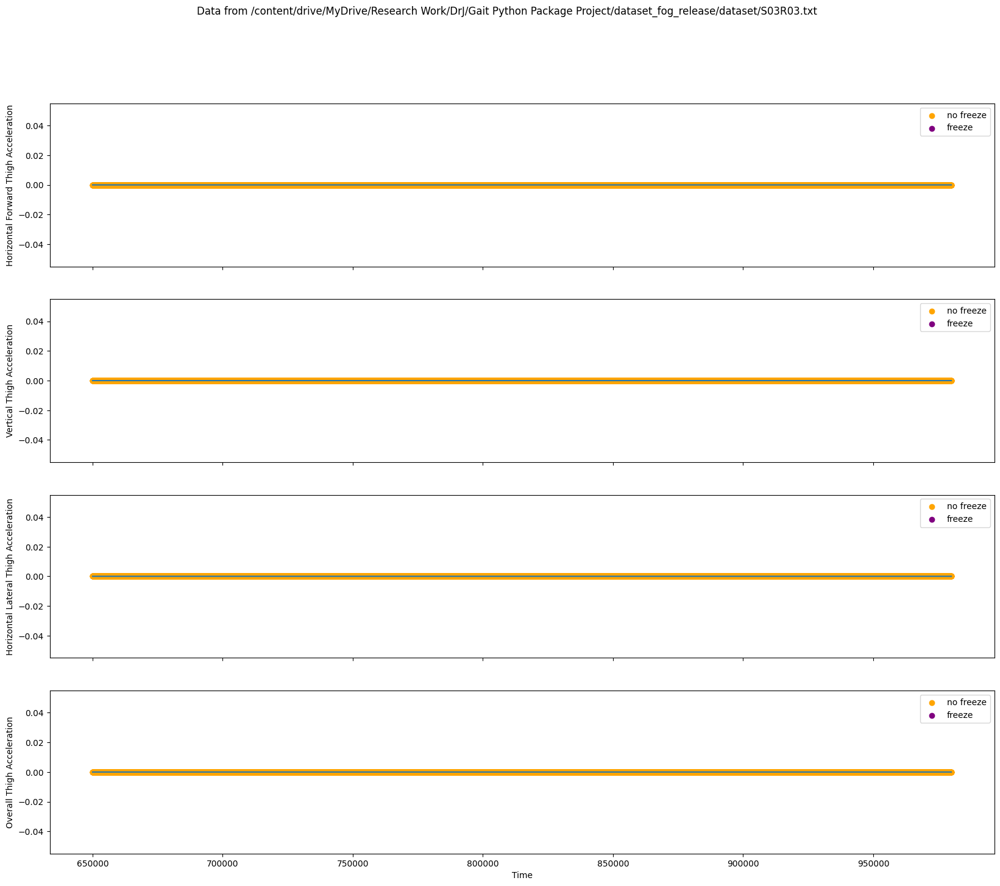

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S04R01.txt


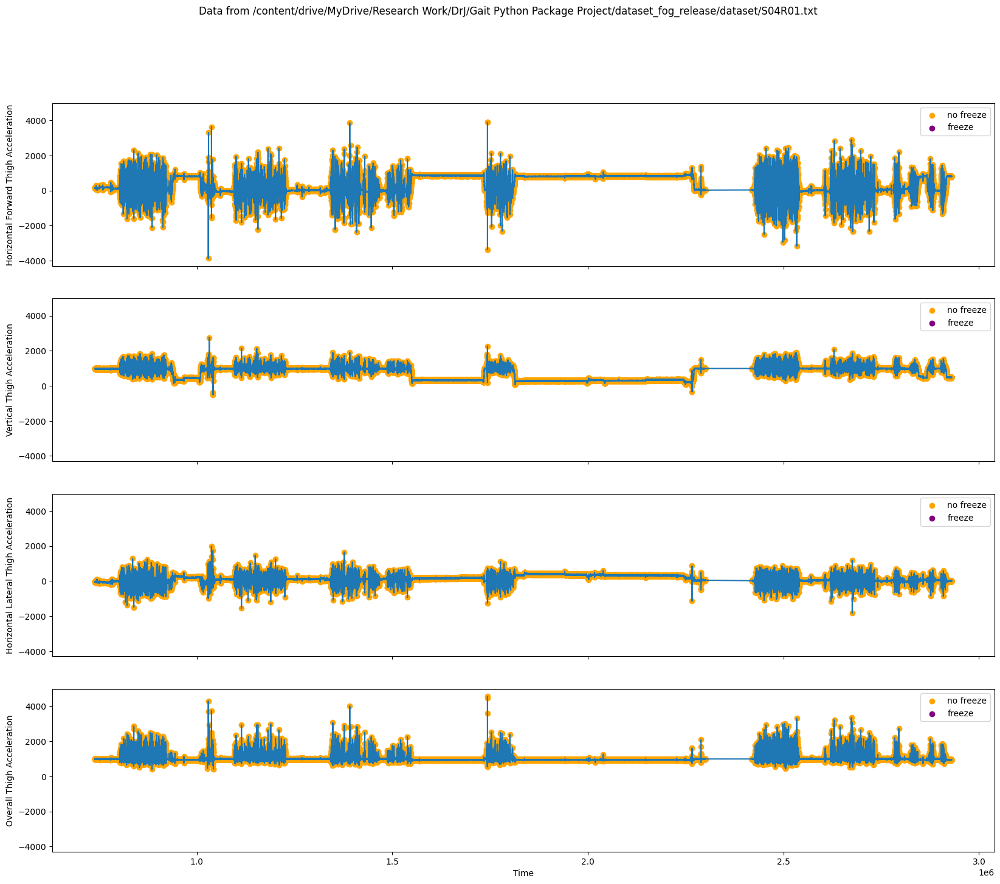

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S05R01.txt


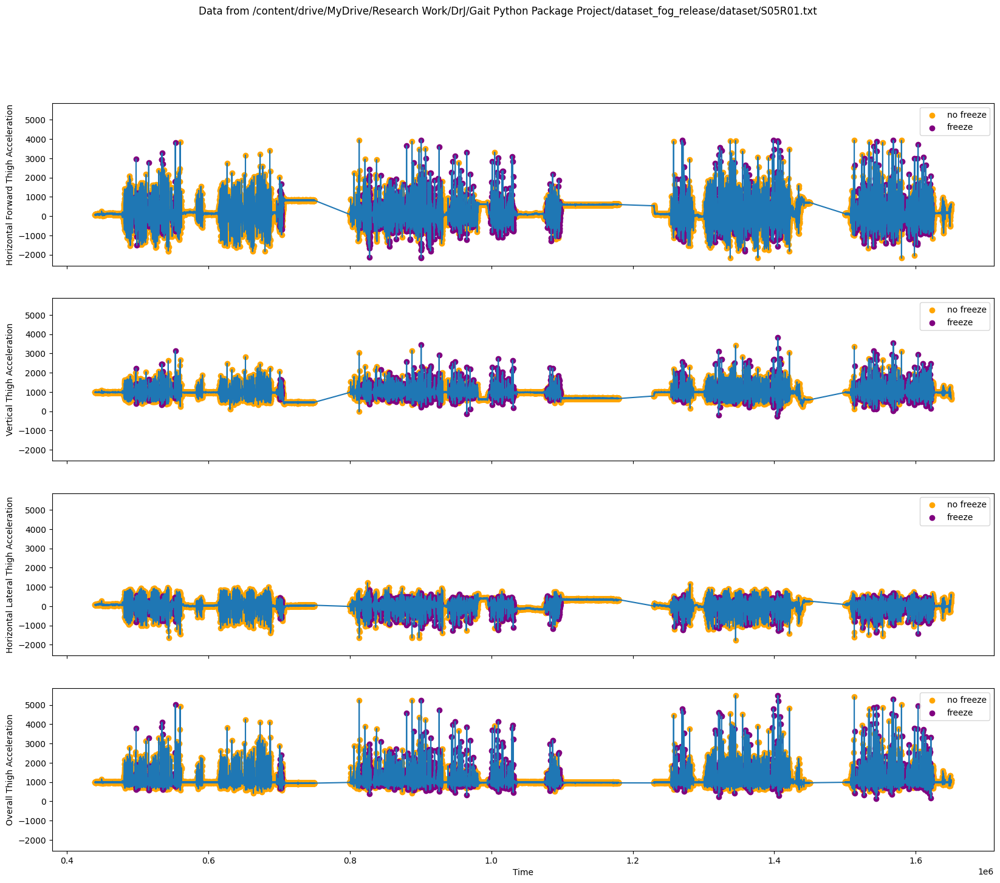

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S05R02.txt


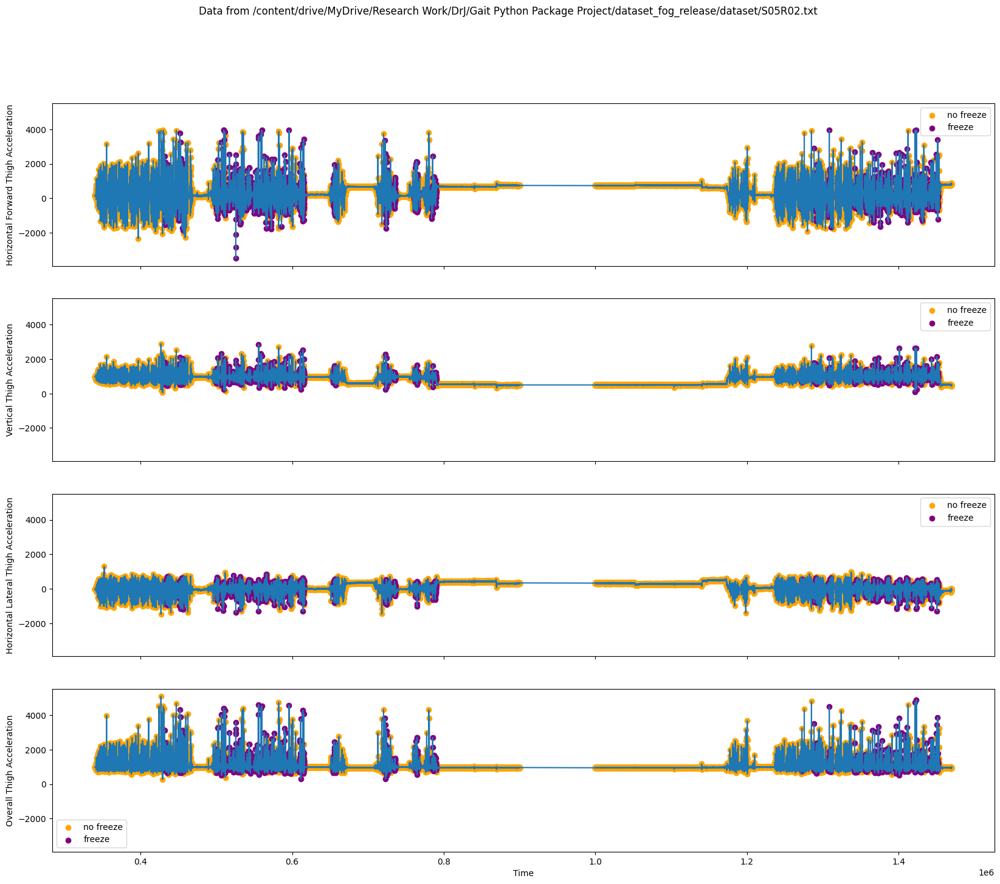

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S06R01.txt


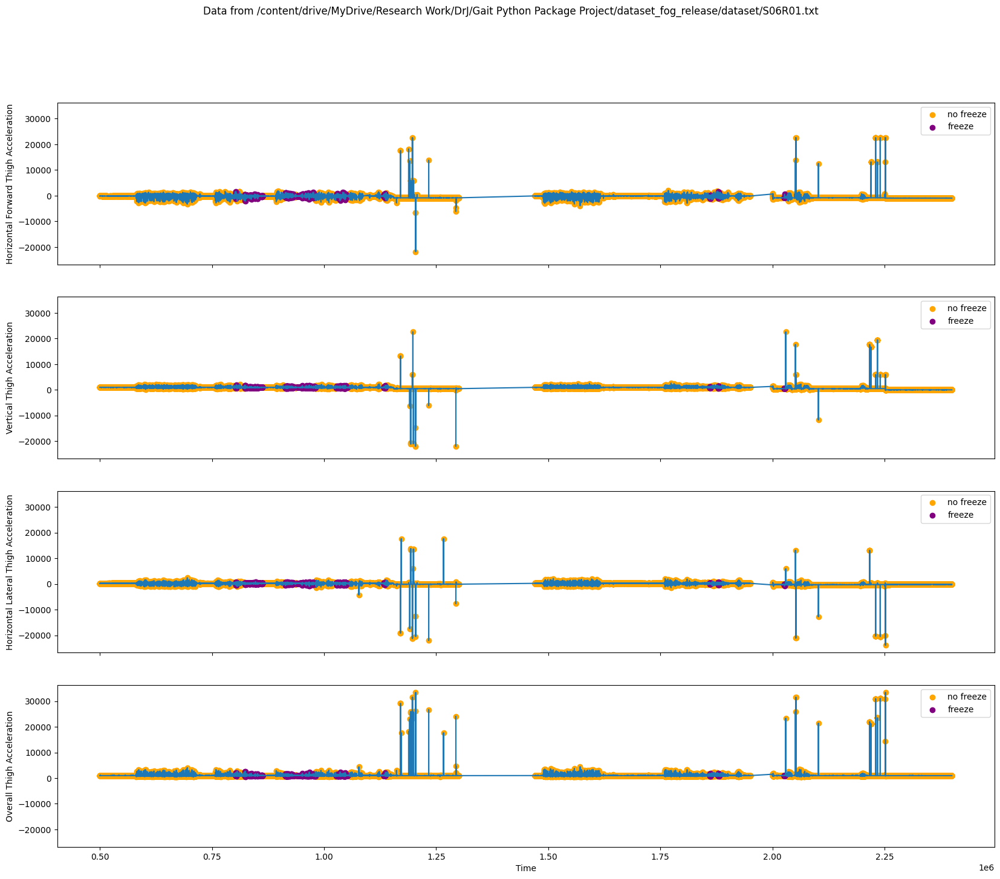

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S06R02.txt


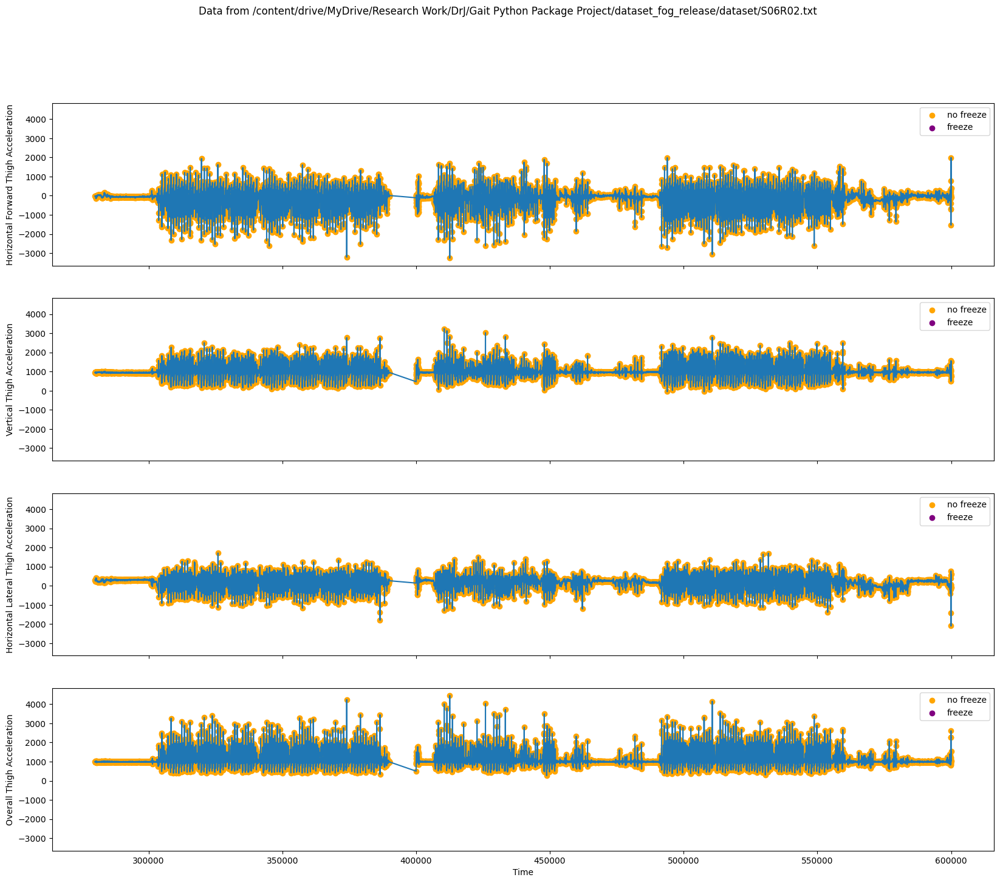

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S07R01.txt


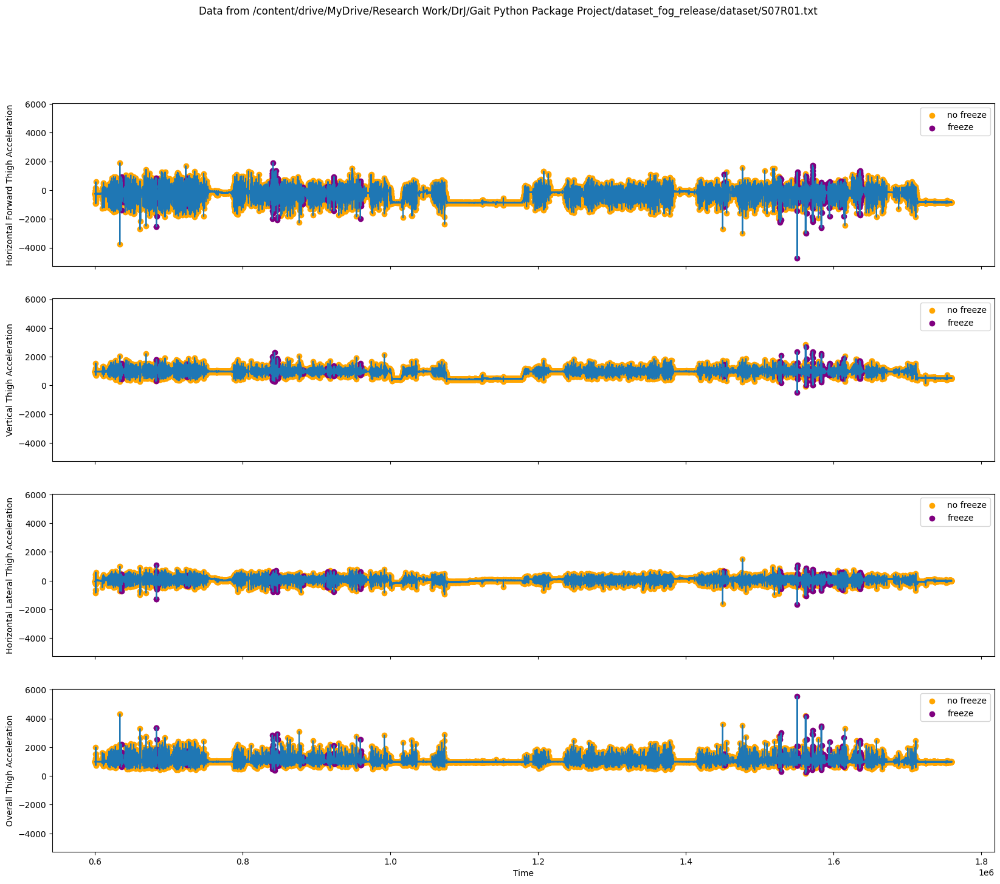

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S07R02.txt


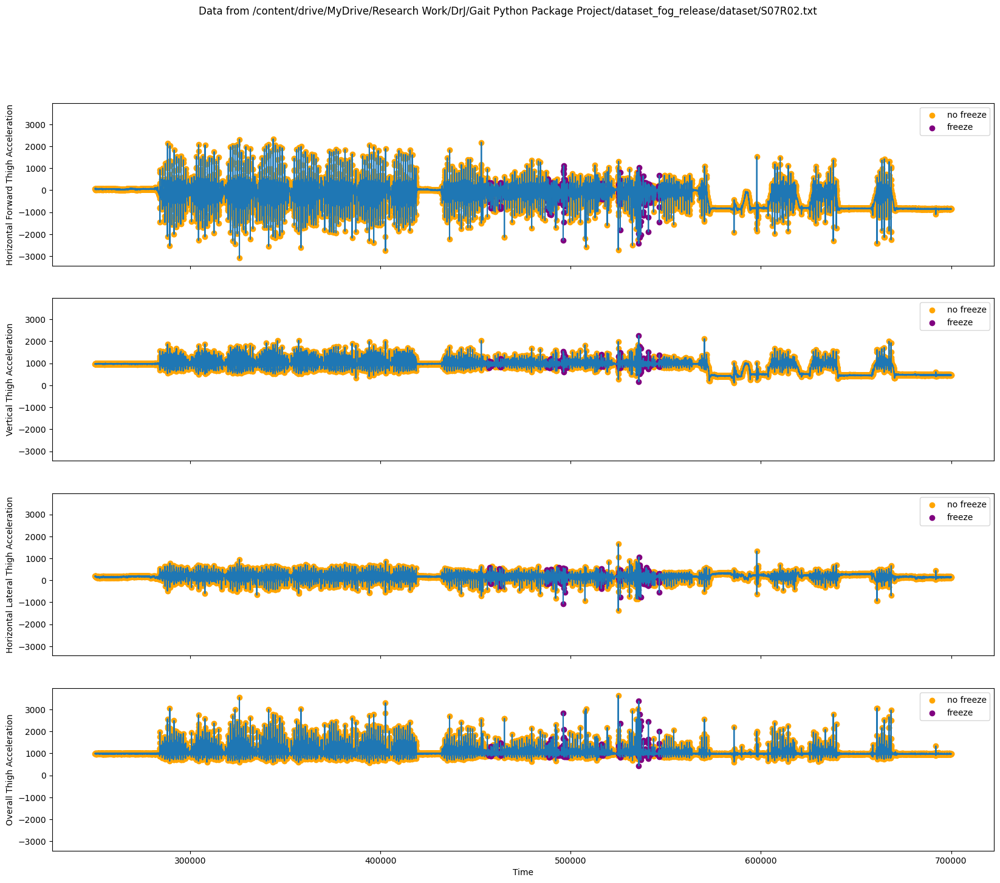

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S08R01.txt


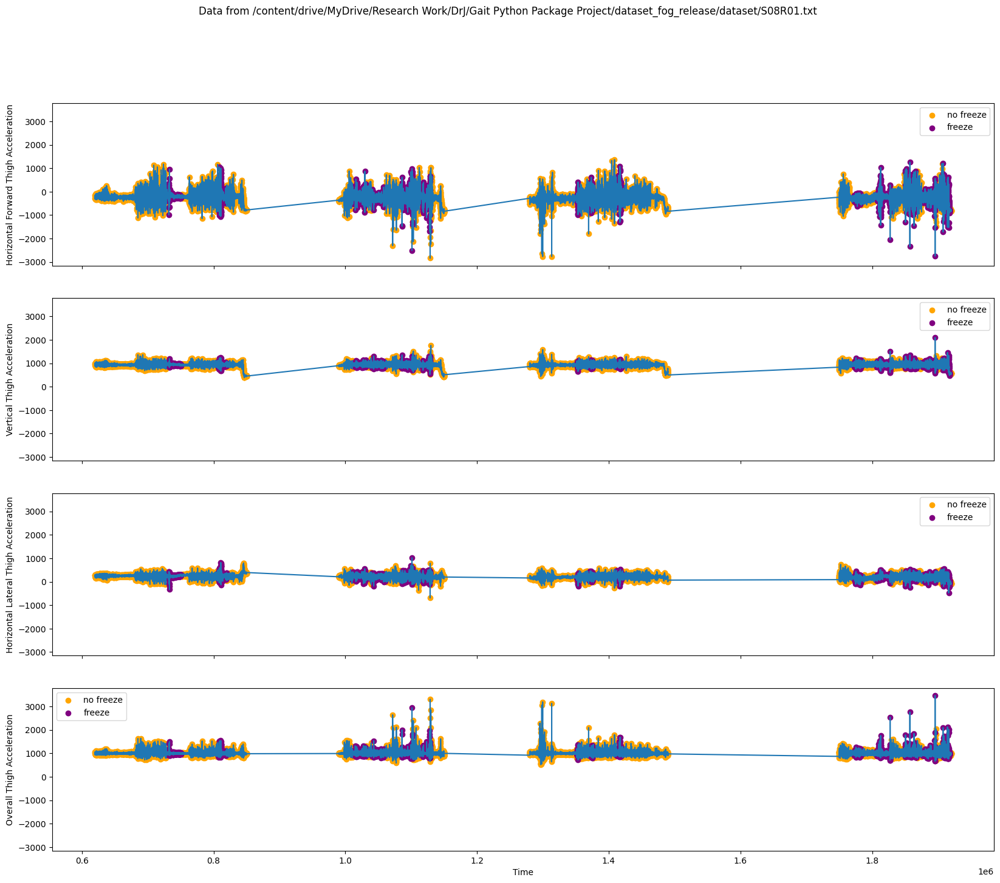

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S09R01.txt


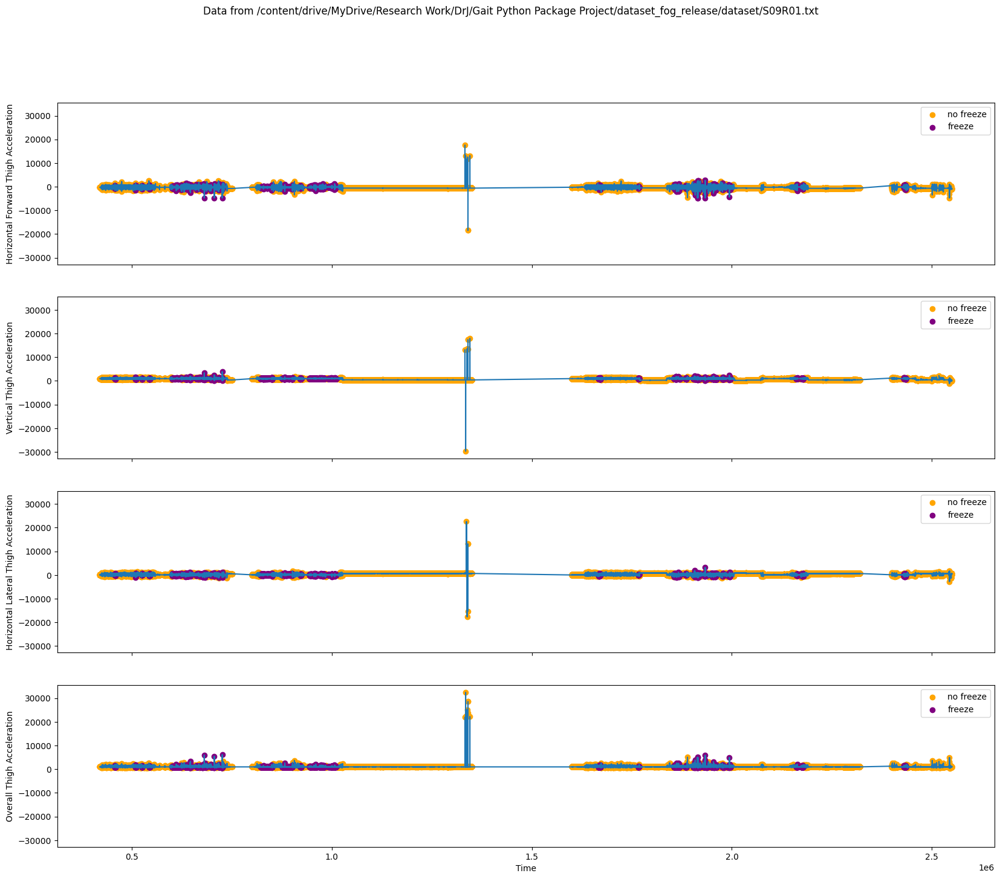

/content/drive/MyDrive/Research Work/DrJ/Gait Python Package Project/dataset_fog_release/dataset/S10R01.txt


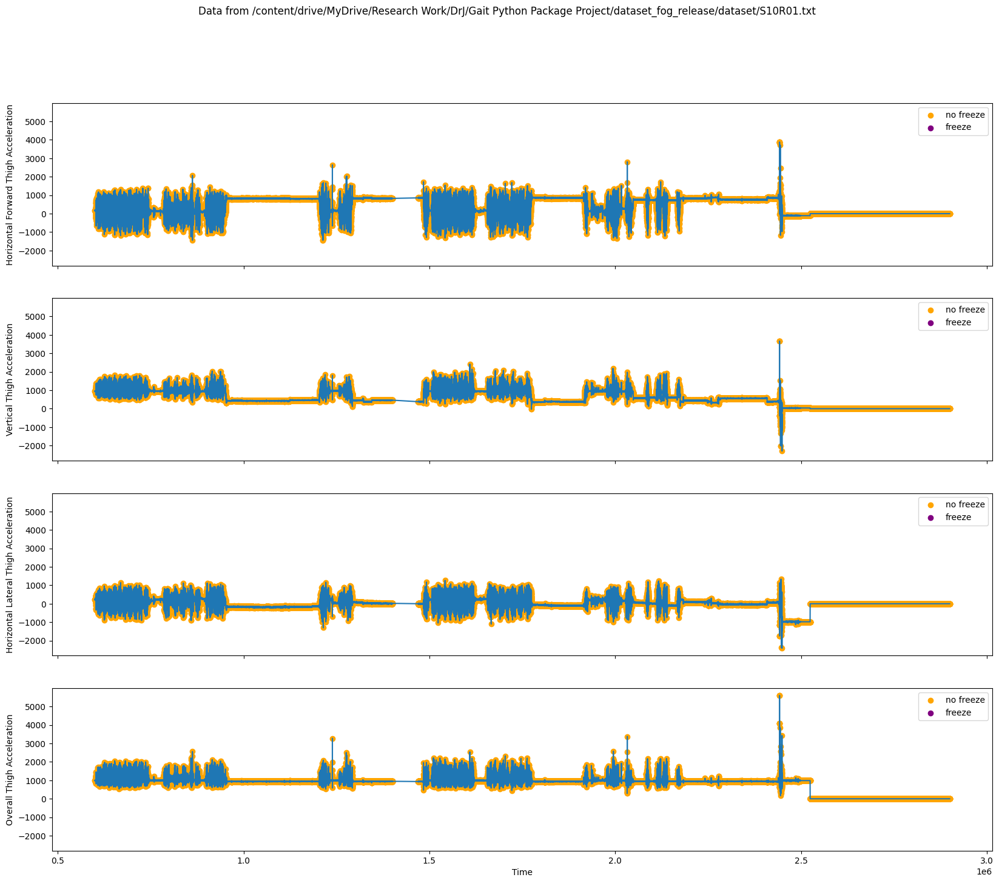

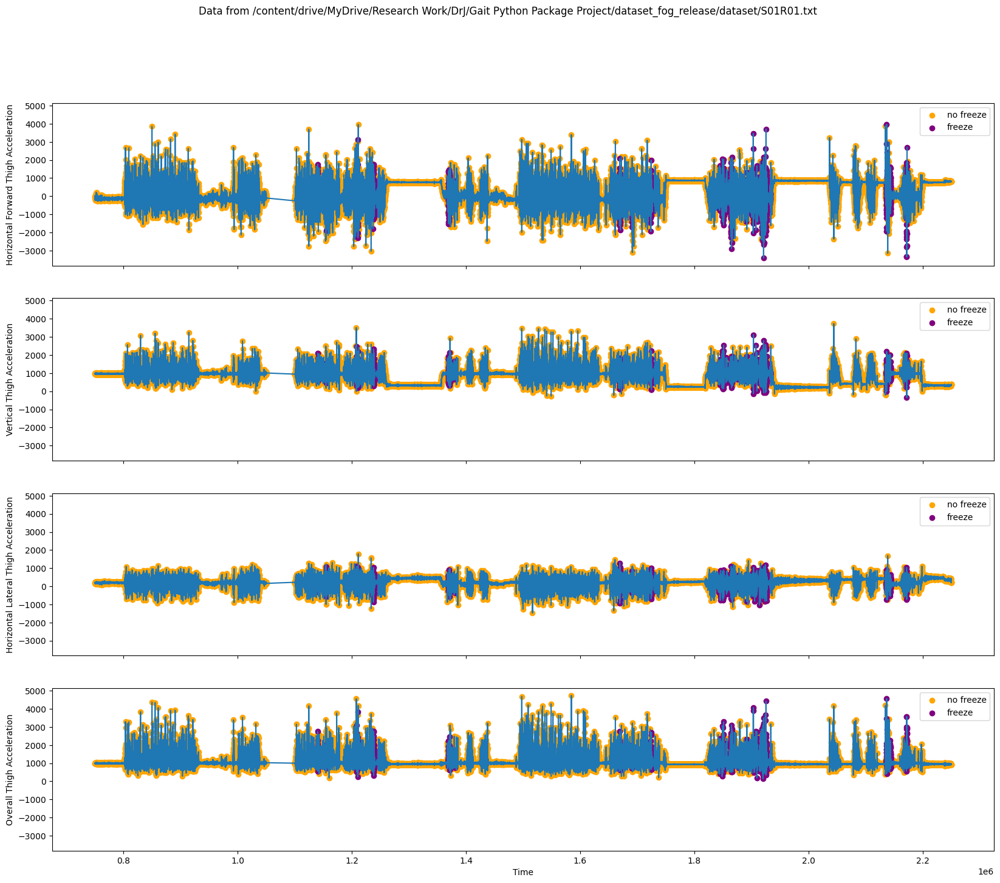

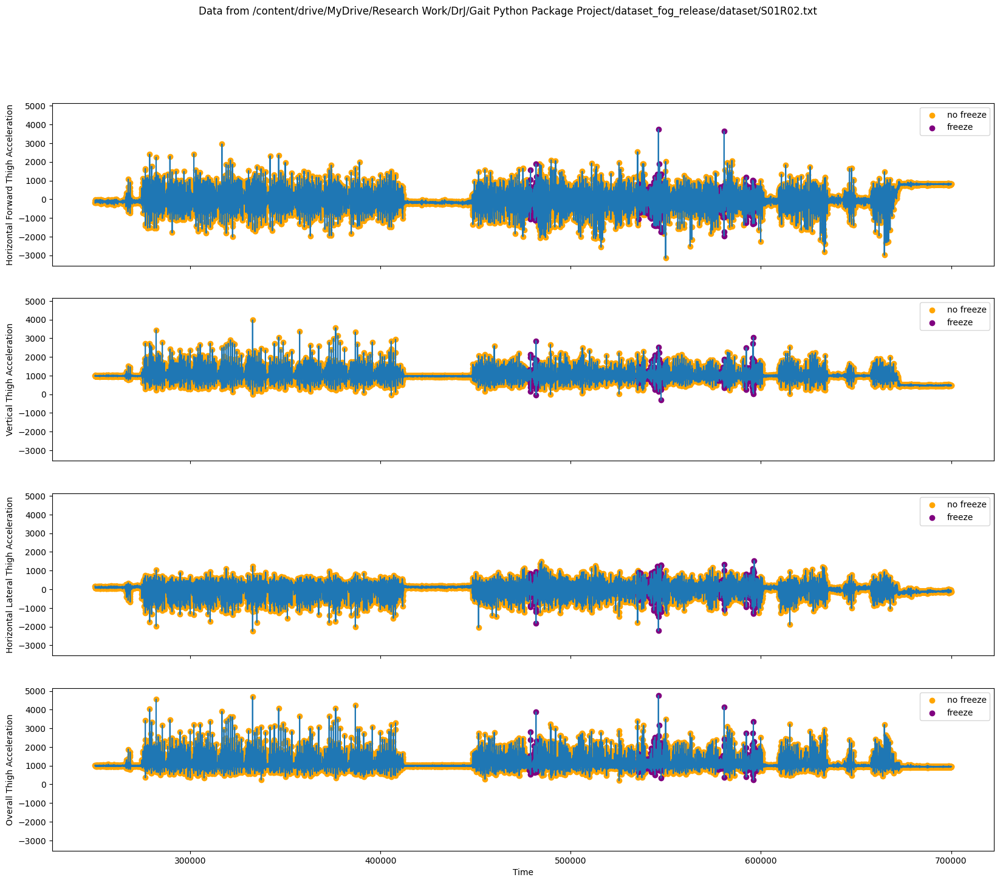

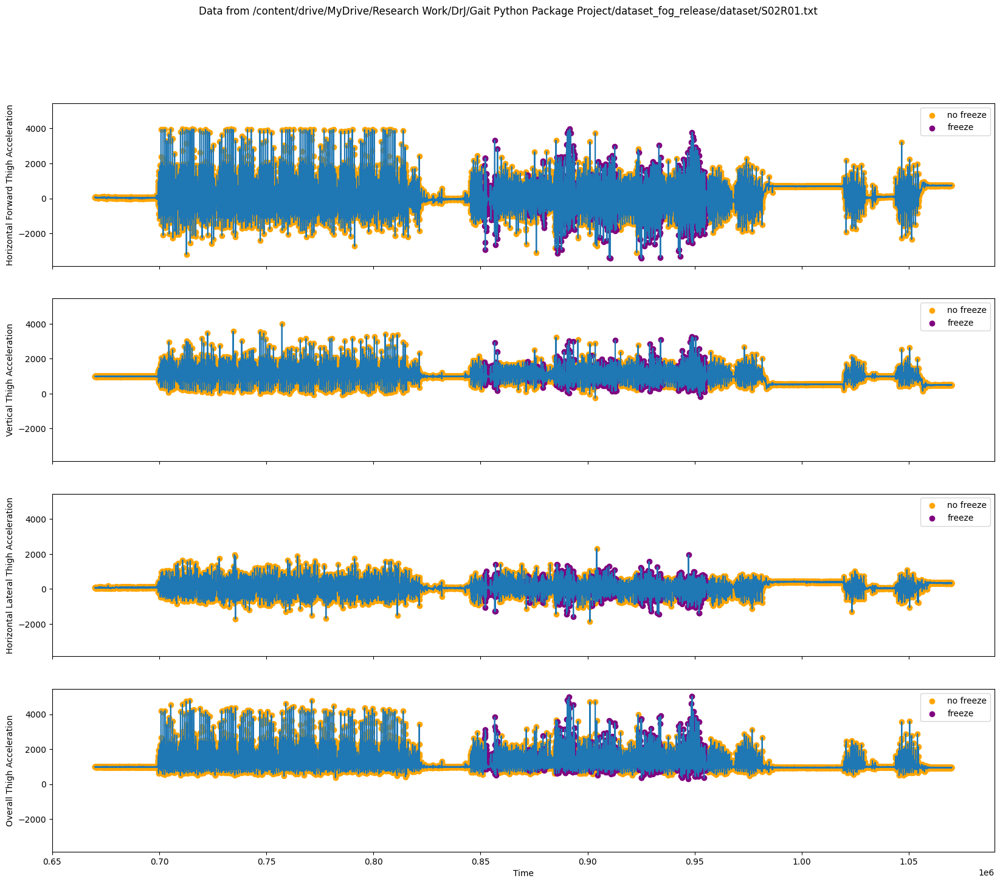

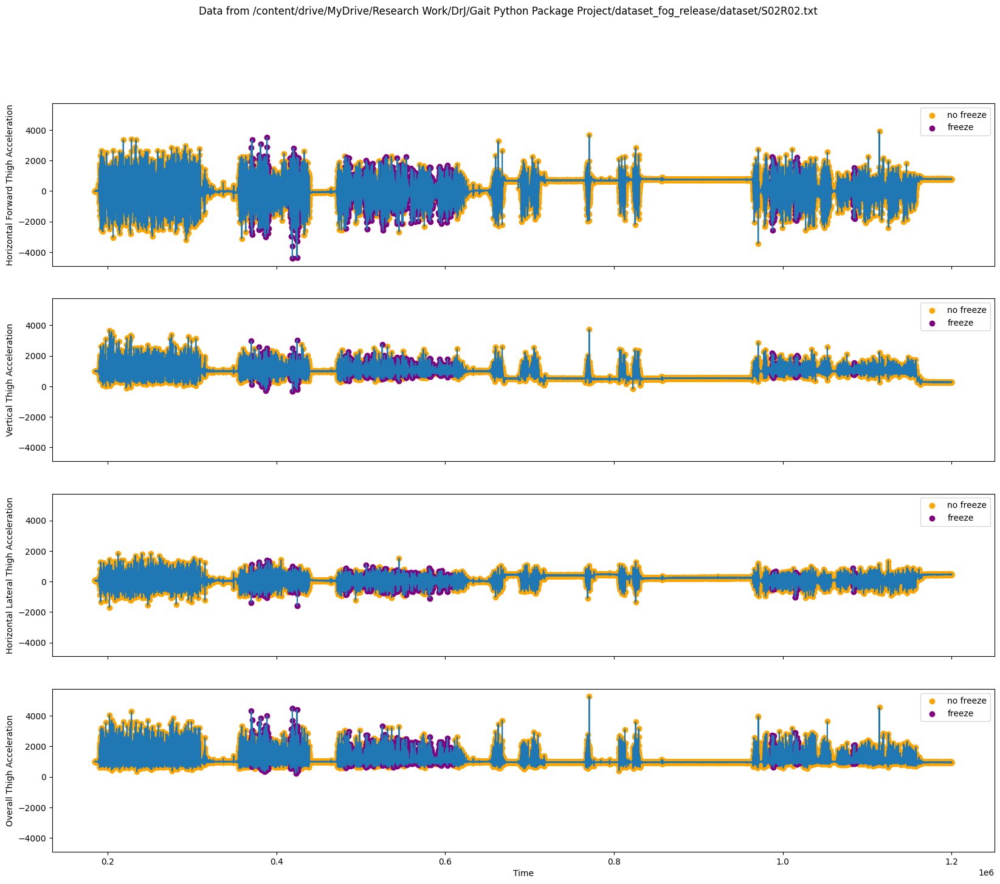

...

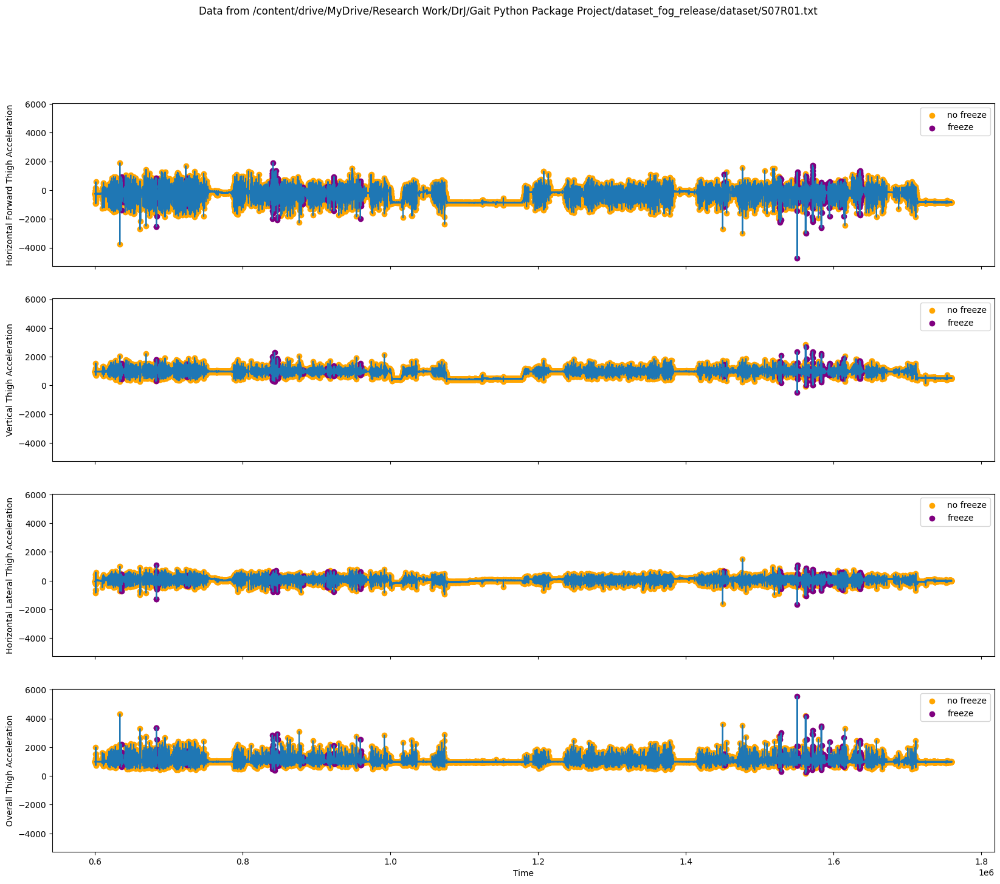

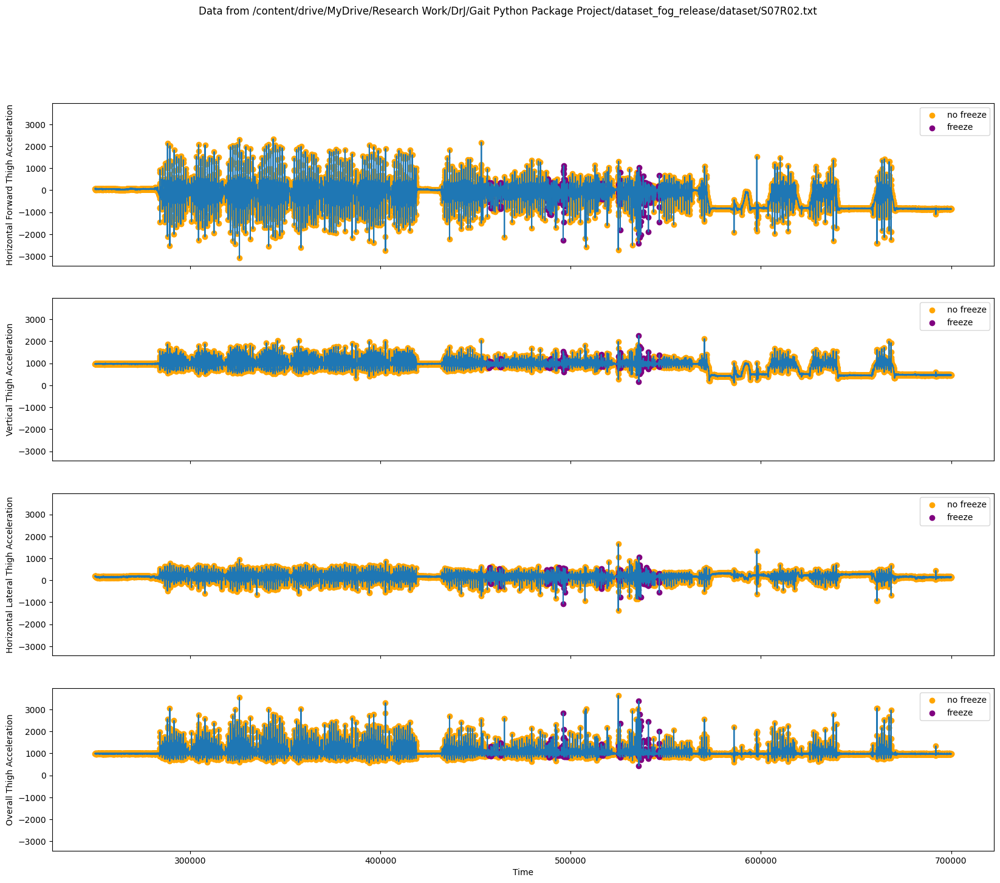

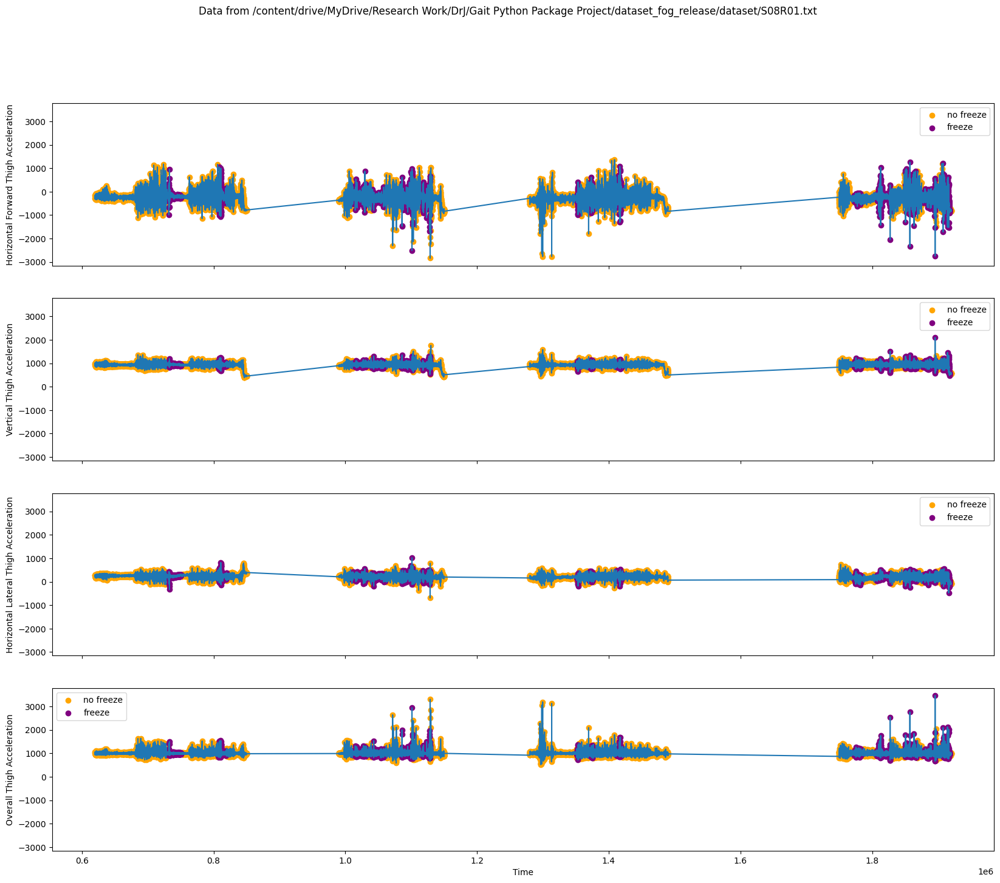

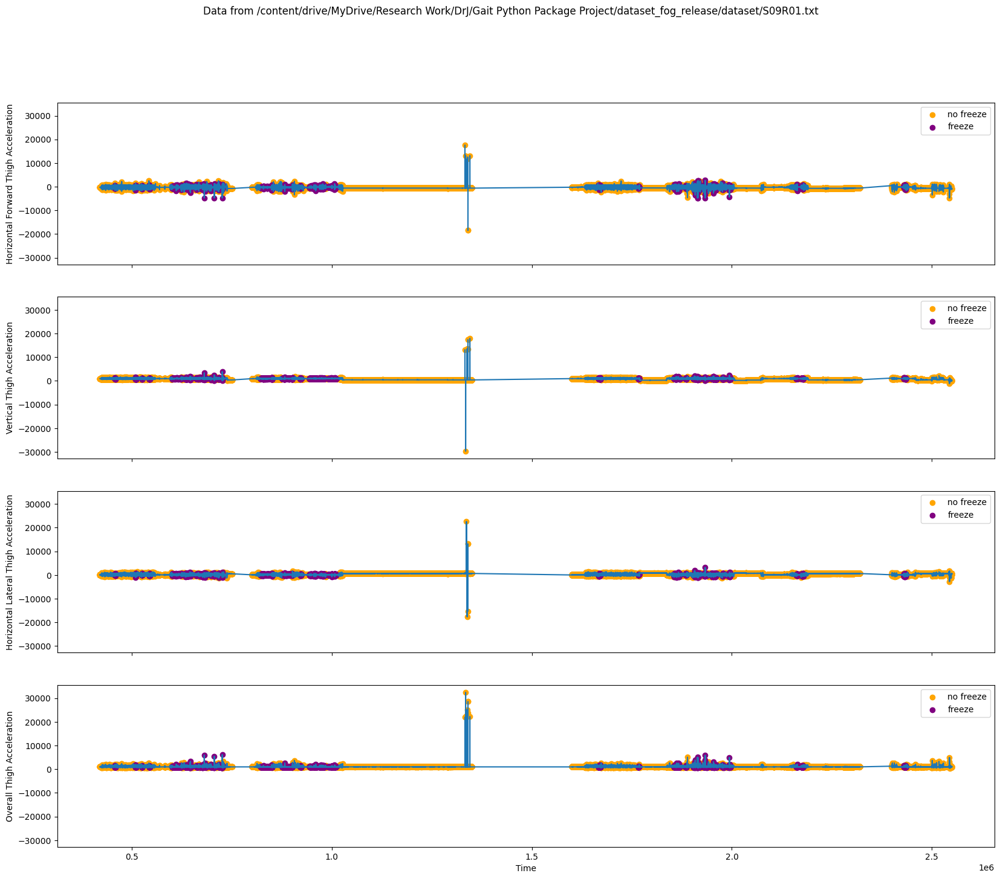

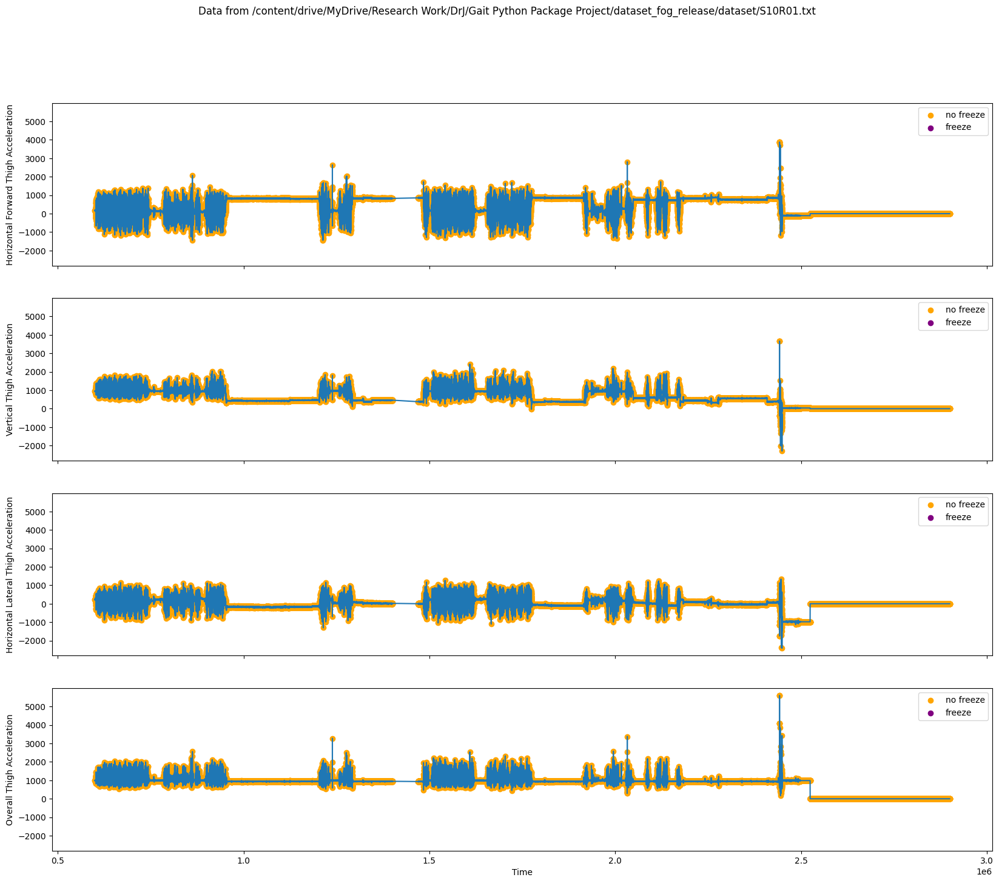

In [7]:
for i in range(len(daphnetThigh)):
    print(daphnetNames[i])
    fig, axes = plt.subplots(4, 1, sharex=True, sharey=True, figsize=(20, 16))
    fig.suptitle("Data from "+daphnetNames[i])
    plt.xlabel("Time")

    df = daphnetThigh[i]
    df = df[df.annotations > 0]
    neg = df[df.annotations == 1]
    pos = df[df.annotations == 2]

    ax1 = axes[0]
    ax1.plot(df.thigh_h_fd)
    ax1.set_ylabel("Horizontal Forward Thigh Acceleration")
    ax1.scatter(neg.index, neg.thigh_h_fd, c='orange', label="no freeze")
    ax1.scatter(pos.index, pos.thigh_h_fd, c='purple', label="freeze")
    ax1.legend()

    ax2 = axes[1]
    ax2.plot(df.thigh_v)
    ax2.set_ylabel("Vertical Thigh Acceleration")
    ax2.scatter(neg.index, neg.thigh_v, c='orange', label="no freeze")
    ax2.scatter(pos.index, pos.thigh_v, c='purple', label="freeze")
    ax2.legend()

    ax3 = axes[2]
    ax3.plot(df.thigh_h_l)
    ax3.set_ylabel("Horizontal Lateral Thigh Acceleration")
    ax3.scatter(neg.index, neg.thigh_h_l, c='orange', label="no freeze")
    ax3.scatter(pos.index, pos.thigh_h_l, c='purple', label="freeze")
    ax3.legend()

    ax4 = axes[3]
    ax4.plot(df.thigh)
    ax4.set_ylabel("Overall Thigh Acceleration")
    ax4.scatter(neg.index, neg.thigh, c='orange', label="no freeze")
    ax4.scatter(pos.index, pos.thigh, c='purple', label="freeze")
    ax4.legend()

    display(fig)

# Features - Daphnet

In [20]:
!pip install pandas==1.1.5


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 37.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... canceled
ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/install.py", line 377, in run
    requirement_set = resolver.resolve(
                      ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 95, in resolve
    result = self._result = resolver.resolve(
                            ^^^^^^^^^^^^^^^^^
  File "/usr/loc

In [21]:
!python -m venv gait_env
!source gait_env/bin/activate  # On Windows: gait_env\Scripts\activate
!pip install pandas==0.20.3
!pip install gaitpy

Error: Command '['/content/gait_env/bin/python3', '-m', 'ensurepip', '--upgrade', '--default-pip']' returned non-zero exit status 1.
/bin/bash: line 1: gait_env/bin/activate: No such file or directory
  Using cached pandas-0.20.3.tar.gz (10.4 MB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Using cached gaitpy-1.6.1-py3-none-any.whl.metadata (7.5 kB)
  Using cached pandas-0.20.3.tar.gz (10.4 MB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This er

In [19]:
!pip install gaitpy

  Using cached gaitpy-1.6.1-py3-none-any.whl.metadata (7.5 kB)
  Using cached pandas-0.20.3.tar.gz (10.4 MB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [18]:
!python "/content/gaitpy/setup.py" install

Traceback (most recent call last):
  File "/content/gaitpy/setup.py", line 7, in <module>
    with open("README.md", "r") as fh:
         ^^^^^^^^^^^^^^^^^^^^^^
FileNotFoundError: [Errno 2] No such file or directory: 'README.md'


In [11]:
# prompt: get stride data from acceleration data

from gaitpy import preprocessing, features

# Assuming 'daphnetThigh' is your list of DataFrames and you want to process the first one
df = daphnetThigh[0]

# Example: Preprocessing (adjust parameters as needed)
# Downsample to 50Hz
df_resampled = preprocessing.resample(df[['thigh']], 50)

# Bandpass filter (0.5-3Hz Butterworth filter)
df_filtered = preprocessing.filter_signal(df_resampled, 0.5, 3, order=1)

# Feature extraction using GaitPy
stride_features = features.extract_stride_features(df_filtered['thigh'])

# Print or further process stride_features
stride_features


ModuleNotFoundError: No module named 'gaitpy'